# Preparing Data

In [1]:
from sklearn.model_selection import train_test_split
import os
import warnings
# warnings.filterwarnings('ignore')
warnings.filterwarnings(action='once')

In [2]:
data_dir = 'input/pins-face-recognition/105_classes_pins_dataset' # The direction of dataset
folders = os.listdir(data_dir)

X, Y = [], []

for category in folders:
    path = os.path.join(data_dir, category)
    for img in os.listdir(path):
        img_path = os.path.join(path, img)
        X.append(img_path)
        Y.append(category[5:])
    
# Seperating dataset as wanted
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.07, random_state=42)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train,
                                                  test_size=0.15, random_state=42)
# train: 57.4%, test: 30.0%, valildation: 12.6%

In [3]:
import pandas as pd

In [200]:
train_Df = pd.DataFrame({'FileName': x_train, 'Category': y_train})
test_Df = pd.DataFrame({'FileName': x_test, 'Category': y_test})
val_Df = pd.DataFrame({'FileName': x_val, 'Category': y_val})

In [272]:
from keras.preprocessing.image import ImageDataGenerator

In [202]:
height, width = 160, 160 # Image height and width
batchSize = len(x_train)//200 # About 100 batches at training
numClasses = len(folders) # Number of classes (outputs)
epochsNum = 60 # Number of epochs

# Creating data generators
train_datagen = ImageDataGenerator(rescale=1./255,
                                  shear_range=0.2, zoom_range=0.2,
                                  horizontal_flip=False)
test_datagen = ImageDataGenerator(rescale=1./255) # Same for validation

# Crating iterators (tuples of (x, y))
train = train_datagen.flow_from_dataframe(train_Df, x_col='FileName', y_col='Category',
                                         target_size=(height, width),
                                         batch_size=batchSize, class_mode='categorical')
test = test_datagen.flow_from_dataframe(test_Df, x_col='FileName', y_col='Category',
                                         target_size=(height, width),
                                         batch_size=batchSize, class_mode='categorical')
validation = test_datagen.flow_from_dataframe(val_Df, x_col='FileName', y_col='Category',
                                         target_size=(height, width),
                                         batch_size=batchSize, class_mode='categorical')

categories = [x for x in train.class_indices]

Found 13860 validated image filenames belonging to 105 classes.

Found 1228 validated image filenames belonging to 105 classes.

Found 2446 validated image filenames belonging to 105 classes.


#### The Data is ready to be trained. Let's check if there is any incorrect data

In [240]:
for i in X:
    if i[-4:] != '.jpg':
        print(f'at {i}: {i[-4:]}')
        break
else:
    print('Images: All good\n')
print(f'Train Categories:\n{train.class_indices}')

Images: All good



Train Categories:

{'Adriana Lima': 0, 'Alex Lawther': 1, 'Alexandra Daddario': 2, 'Alvaro Morte': 3, 'Amanda Crew': 4, 'Andy Samberg': 5, 'Anne Hathaway': 6, 'Anthony Mackie': 7, 'Avril Lavigne': 8, 'Ben Affleck': 9, 'Bill Gates': 10, 'Bobby Morley': 11, 'Brenton Thwaites': 12, 'Brian J. Smith': 13, 'Brie Larson': 14, 'Chris Evans': 15, 'Chris Hemsworth': 16, 'Chris Pratt': 17, 'Christian Bale': 18, 'Cristiano Ronaldo': 19, 'Danielle Panabaker': 20, 'Dominic Purcell': 21, 'Dwayne Johnson': 22, 'Eliza Taylor': 23, 'Elizabeth Lail': 24, 'Emilia Clarke': 25, 'Emma Stone': 26, 'Emma Watson': 27, 'Gwyneth Paltrow': 28, 'Henry Cavil': 29, 'Hugh Jackman': 30, 'Inbar Lavi': 31, 'Irina Shayk': 32, 'Jake Mcdorman': 33, 'Jason Momoa': 34, 'Jennifer Lawrence': 35, 'Jeremy Renner': 36, 'Jessica Barden': 37, 'Jimmy Fallon': 38, 'Johnny Depp': 39, 'Josh Radnor': 40, 'Katharine Mcphee': 41, 'Katherine Langford': 42, 'Keanu Reeves': 43, 'Krysten Ritter': 44, 'Leonardo DiCaprio': 45

#### Frequency

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

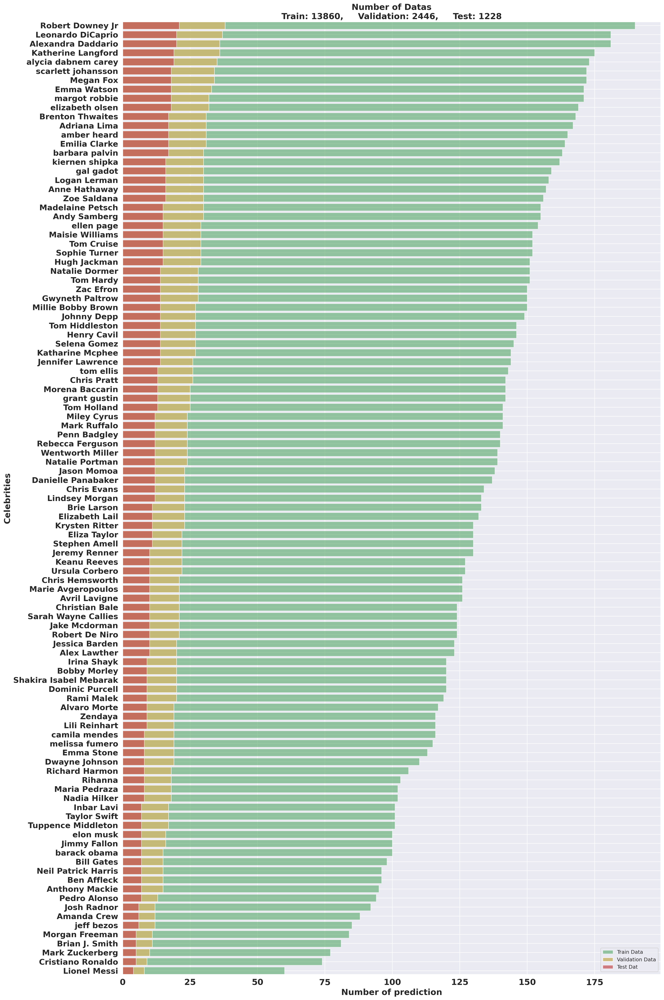

In [247]:
train_counter = train_Df['Category'].value_counts(sort=False).to_frame()
train_counter = pd.DataFrame({'Category': train_counter.index.tolist(), 'Count': train_counter['count'].tolist()})
train_counter.sort_values(by='Count', inplace=True)

test_counter = test_Df['Category'].value_counts(sort=False).to_frame()
test_counter = pd.DataFrame({'Category': test_counter.index.tolist(), 'Count': test_counter['count'].tolist()})
test_counter.sort_values(by='Count', inplace=True)

val_counter = val_Df['Category'].value_counts(sort=False).to_frame()
val_counter = pd.DataFrame({'Category': val_counter.index.tolist(), 'Count': val_counter['count'].tolist()})
val_counter.sort_values(by='Count', inplace=True)


plt.figure(figsize=[20, 30], dpi=200)
sns.set_theme()
plt.xlabel('Number of prediction', fontweight='bold', fontsize=18)
plt.ylabel(f'Celebrities', fontweight='bold', fontsize=18)
plt.xticks(fontweight='bold', fontsize=18)
plt.yticks(range(len(train_counter)),(x for x in train_counter.Category), rotation=0, fontweight='bold', fontsize=17)
plt.barh(range(len(train_counter)), train_counter.Count, alpha=0.6, align='center', color='g', label='Train Data')
plt.barh(range(len(val_counter)), val_counter.Count, alpha=0.9, align='center', color='y', label='Validation Data')
plt.barh(range(len(test_counter)), test_counter.Count, alpha=0.7, align='center', color='r', label='Test Dat')
# title text:
text = f'''Number of Datas
Train: {len(train_Df)},     Validation: {len(val_Df)},     Test: {len(test_Df)}'''
    
plt.title(text, fontweight='bold', fontsize=18)
plt.tight_layout()
plt.margins(y=0)
plt.legend()

plt.show()

#### Some of the training images

/usr/local/lib/python3.8/dist-packages/keras/preprocessing/image.py:2610: DeprecationWarning: Please use `affine_transform` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.

  ndimage.interpolation.affine_transform(


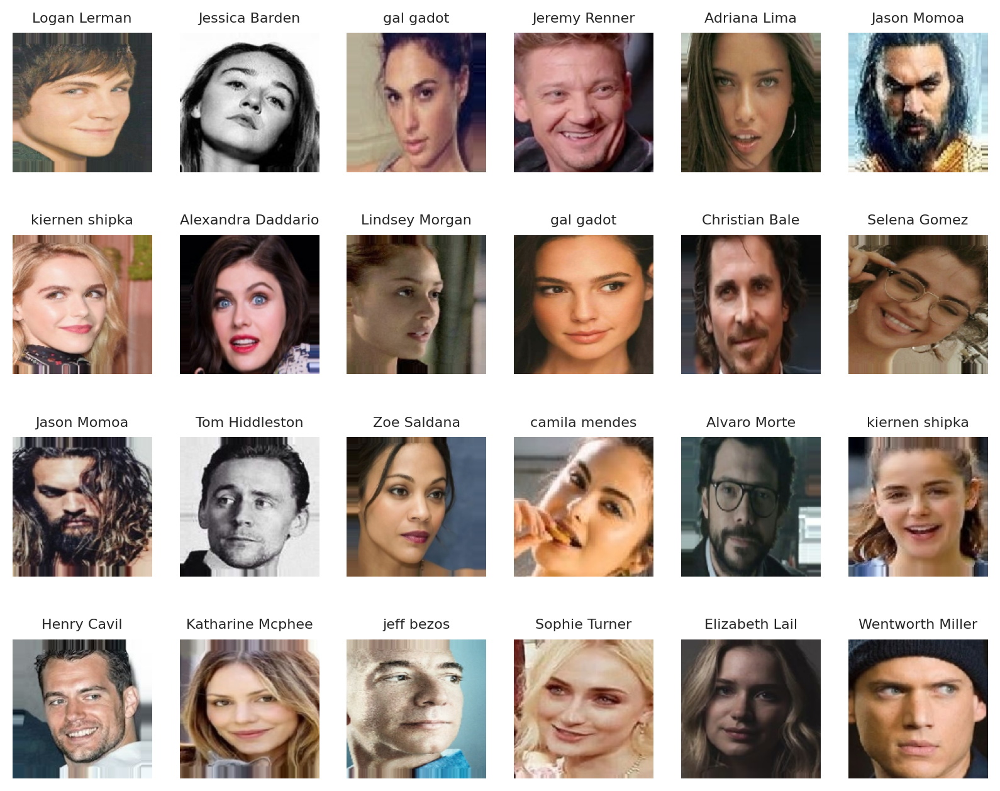

In [239]:
sampleImg, sampleLabel = next(train)

plt.figure(figsize=[10, 8], dpi=200)
for i in range(24):
    plt.subplot(4, 6, i+1)
    plt.imshow(sampleImg[i])
    plt.axis('off')
    plt.title(categories[np.argmax(sampleLabel[i])], fontsize=8)    
plt.show()

#

# Convolutional Neural Network

In [8]:
# Library setup
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, BatchNormalization, GlobalAvgPool2D, AveragePooling2D, MaxPooling2D, Flatten, Dense, Dropout

In [248]:
# Limiting GPU memory usage
gpus = tf.config.list_physical_devices('GPU')
try:
    tf.config.set_logical_device_configuration(gpus[0],
                                              [tf.config.LogicalDeviceConfiguration(memory_limit=4000)])
except RuntimeError as e:
    print(e)

### Creating Model

In [15]:
CNN = Sequential() #Creating Neural Network

CNN.add(Conv2D(filters=64, kernel_size=3, activation='relu',
                                input_shape=[height, width, 3])) #Adding Conv Layer
CNN.add(Conv2D(filters=64, kernel_size=3, activation='relu')) #Adding Conv Layer
CNN.add(MaxPooling2D(pool_size=3, strides=2))


CNN.add(Conv2D(filters=128, kernel_size=3, activation='relu')) #Adding Conv Layer
CNN.add(Conv2D(filters=128, kernel_size=3, activation='relu')) #Adding Conv Layer
CNN.add(MaxPooling2D(pool_size=3, strides=2))


CNN.add(Conv2D(filters=256, kernel_size=3, activation='relu')) #Adding Conv Layer
CNN.add(Conv2D(filters=256, kernel_size=3, activation='relu')) #Adding Conv Layer
CNN.add(Conv2D(filters=256, kernel_size=3, activation='relu')) #Adding Conv Layer
CNN.add(MaxPooling2D(pool_size=3, strides=2))


CNN.add(Conv2D(filters=512, kernel_size=3, activation='relu')) #Adding Conv Layer
CNN.add(Conv2D(filters=512, kernel_size=3, activation='relu')) #Adding Conv Layer
CNN.add(Conv2D(filters=512, kernel_size=3, activation='relu')) #Adding Conv Layer
CNN.add(MaxPooling2D(pool_size=3, strides=2))


CNN.add(Conv2D(filters=1024, kernel_size=2, activation='relu')) #Adding Conv Layer
CNN.add(AveragePooling2D(pool_size=2, strides=1)) #Adding Pooling Layer

CNN.add(Flatten()) #Flattening

CNN.add(Dense(units=128, activation='tanh')) #Adding Full Connection Layer

CNN.add(Dense(units=numClasses, activation='softmax')) #Adding Output Layer

### Training Model

In [12]:
# Training the Neual Network and saving wheights at each epoch
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='CNN\weights.{epoch:02d}-{val_loss:.2f}.h5',
                                               monitor='val_loss', save_best_only=False)
CNN.compile(optimizer='Adamax', loss='categorical_crossentropy', metrics=['accuracy'])
CNN.fit(x=train, validation_data=validation, epochs=epochsNum, shuffle=True, callbacks=[checkpoint])

<>:2: DeprecationWarning: invalid escape sequence \w


Epoch 1/60


2023-06-30 17:28:26.529681: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32

	 [[{{node Placeholder/_0}}]]

2023-06-30 17:28:29.567727: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8600

2023-06-30 17:28:32.960333: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 3.62GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.

2023-06-30 17:28:32.960452: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 3.62GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there coul

201/201 [==============================] - ETA: 0s - loss: 4.6478 - accuracy: 0.0119

2023-06-30 17:35:28.693466: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32

	 [[{{node Placeholder/_0}}]]


201/201 [==============================] - 449s 2s/step - loss: 4.6478 - accuracy: 0.0119 - val_loss: 4.6352 - val_accuracy: 0.0123

Epoch 2/60

201/201 [==============================] - 353s 2s/step - loss: 4.6210 - accuracy: 0.0140 - val_loss: 4.5557 - val_accuracy: 0.0225

Epoch 3/60

201/201 [==============================] - 359s 2s/step - loss: 4.5128 - accuracy: 0.0203 - val_loss: 4.4038 - val_accuracy: 0.0262

Epoch 4/60

201/201 [==============================] - 361s 2s/step - loss: 4.1930 - accuracy: 0.0487 - val_loss: 3.9980 - val_accuracy: 0.0593

Epoch 5/60

201/201 [==============================] - 361s 2s/step - loss: 3.8797 - accuracy: 0.0851 - val_loss: 3.7677 - val_accuracy: 0.1051

Epoch 6/60

201/201 [==============================] - 353s 2s/step - loss: 3.6324 - accuracy: 0.1228 - val_loss: 3.5981 - val_accuracy: 0.1296

Epoch 7/60

201/201 [==============================] - 358s 2s/step - loss: 3.3727 - accuracy: 0.1738 - val_loss: 3.3213 - val_accuracy: 0.175

### Visualizing the Model performance at each epoch

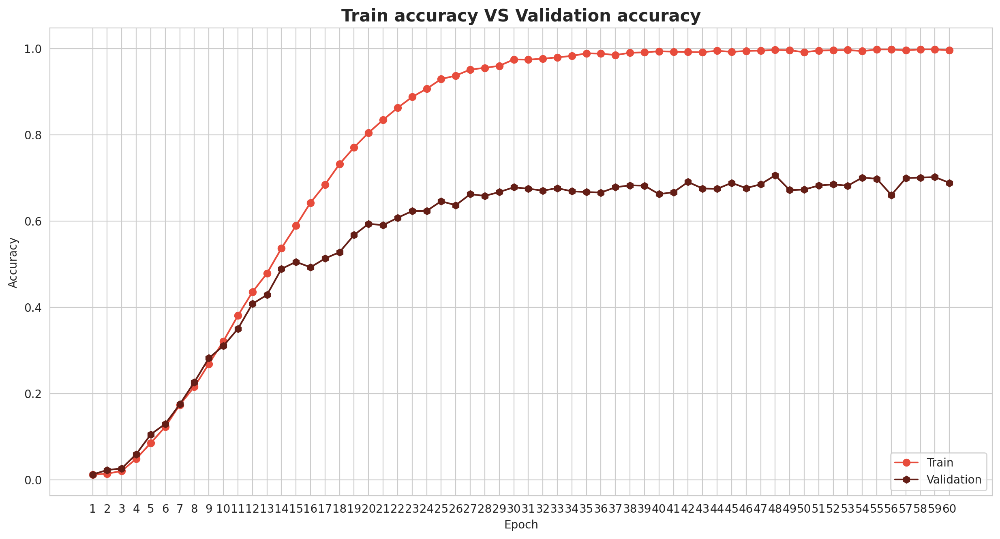

In [13]:
plt.figure(figsize=(15, 7.5), dpi=200)
sns.set_style('whitegrid')
plt.plot([str(x+1) for x in range(epochsNum)], CNN.history.history['accuracy'], color='#E74C3C', marker='o')
plt.plot([str(x+1) for x in range(epochsNum)], CNN.history.history['val_accuracy'], color='#641E16', marker='h')
plt.title('Train accuracy VS Validation accuracy', fontsize=15, fontweight='bold')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

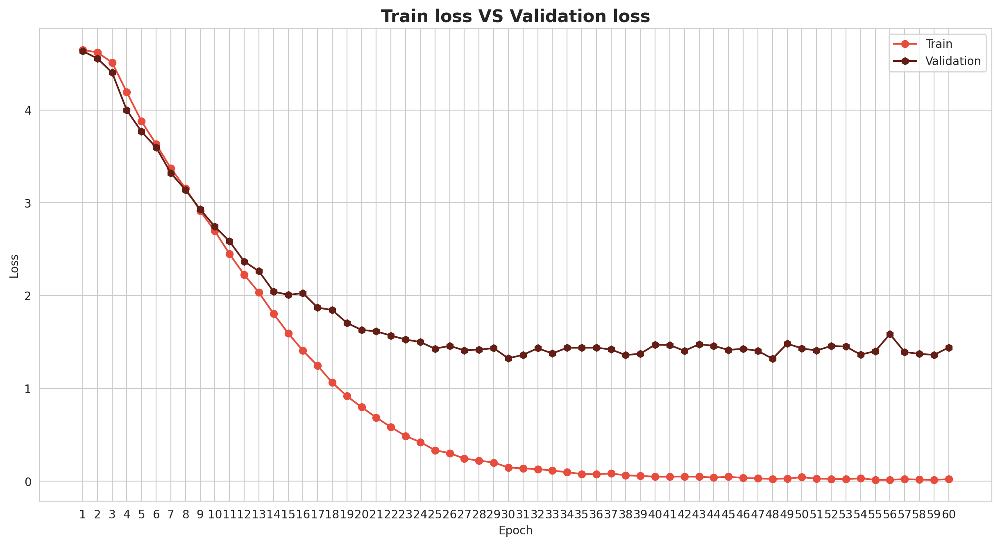

In [14]:
plt.figure(figsize=(15, 7.5), dpi=200)
sns.set_style('whitegrid')
plt.plot([str(x+1) for x in range(epochsNum)], CNN.history.history['loss'], color='#E74C3C', marker='o')
plt.plot([str(x+1) for x in range(epochsNum)], CNN.history.history['val_loss'], color='#641E16', marker='h')
plt.title('Train loss VS Validation loss', fontsize=15, fontweight='bold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()

#### Seems like the 48th Epoch has the best Accuracy and loss

######

### Selecting the best weights

In [10]:
from keras.models import load_model

In [269]:
Model = load_model('CNN\weights.48-1.32.h5')

#

# Evaluation

#### Evaliuating the model by Confusion matrix and Precision, Recall and F1-score methods

In [12]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import numpy as np

In [13]:
prediction, img, label = [], [], []
for i in range(len(test)):
    img.extend(test[i][0])
    prediction.extend(Model.predict(test[i][0], verbose=0))
    label.extend(test[i][1])
else:
    prediction, label = np.array(prediction, dtype='float32'), np.array(label, dtype='float32')
    
    test_pred_classes = np.argmax(prediction, axis=1)
    test_actual_classes = [np.argmax(x) for x in label]

2023-07-01 06:45:02.546931: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8600


In [264]:
clf_report = classification_report(test_actual_classes, test_pred_classes)

print(f'Classification Report:\n{clf_report}')

Classification Report:

              precision    recall  f1-score   support



           0       0.82      0.93      0.87        15

           1       0.69      0.85      0.76        13

           2       0.92      0.73      0.81        15

           3       0.83      0.71      0.77         7

           4       0.91      0.83      0.87        12

           5       0.50      0.60      0.55        10

           6       0.71      0.80      0.75        15

           7       0.80      1.00      0.89         8

           8       1.00      0.57      0.73        14

           9       0.80      0.80      0.80        10

          10       0.71      1.00      0.83         5

          11       0.39      1.00      0.56         7

          12       0.70      0.78      0.74         9

          13       0.86      0.60      0.71        10

          14       0.62      0.67      0.64        12

          15       0.50      0.18      0.27        11

          16       0.69      0.90      

#### Some of the predicted images

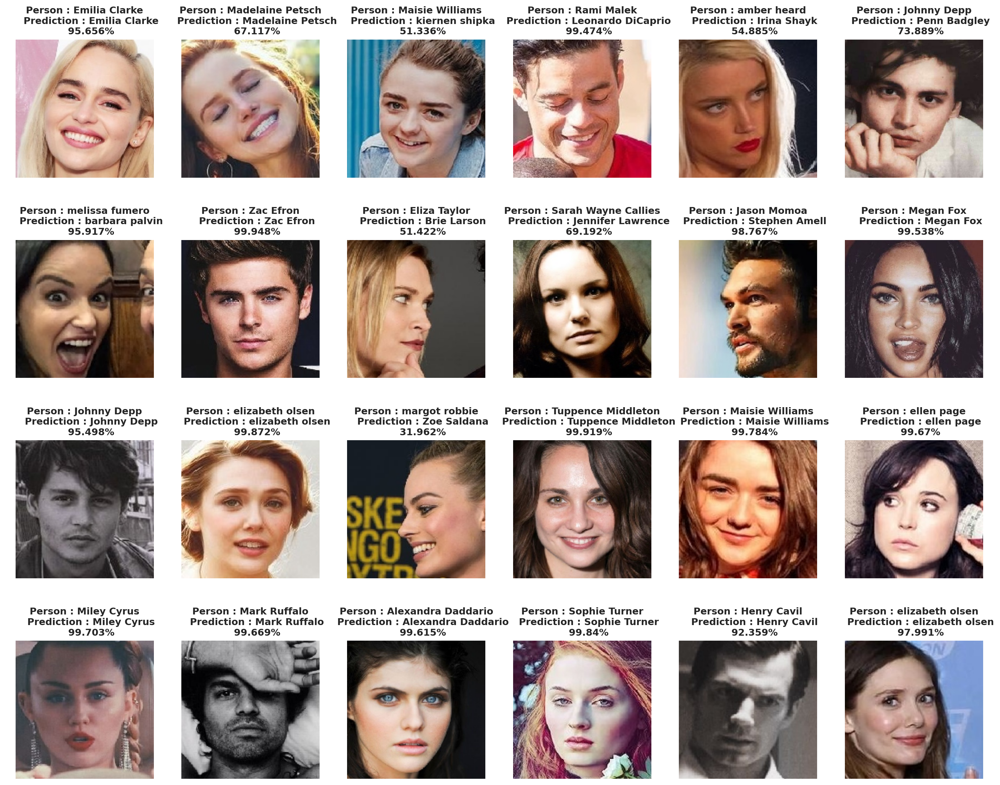

In [267]:
plt.figure(figsize=[20, 16], dpi=200)
for i in range(24):
    plt.subplot(4, 6, i+1)
    plt.imshow(img[i])
    plt.axis('off')
    plt.title(f'''Person : {categories[test_actual_classes[i]]}
    Prediction : {categories[test_pred_classes[i]]}
    {round((100 * np.max(prediction[i])), 3)}%''', fontsize=11, fontweight='bold')
                                                                                                       
plt.show()

### Model preformance on Bar plot

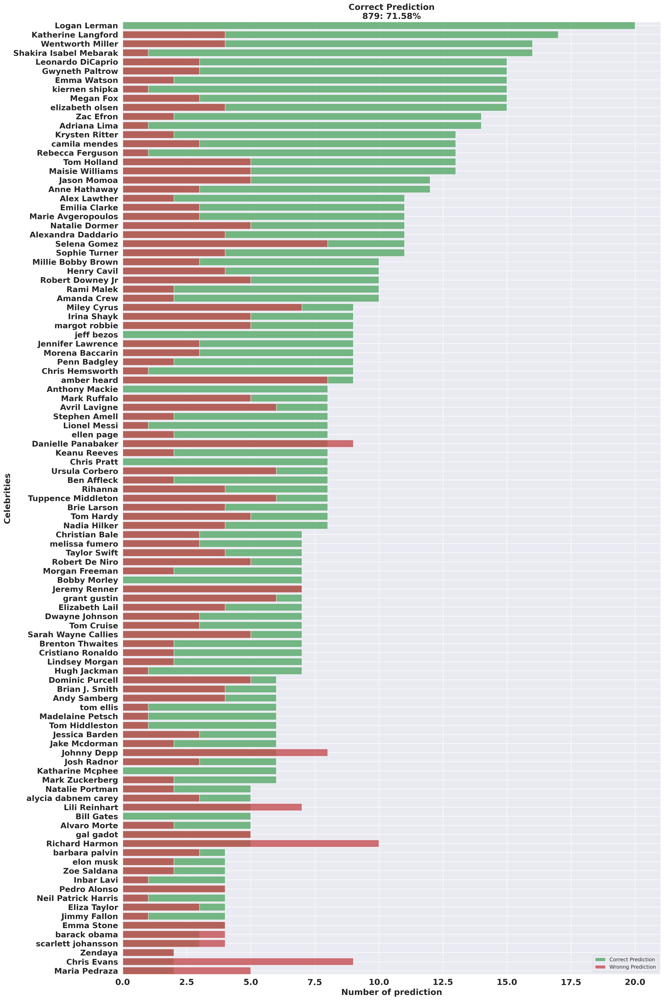

In [271]:
confusionMatrix = confusion_matrix(test_actual_classes, test_pred_classes)
correctPrediction = []
wrongPrediction = []

for i in range(len(confusionMatrix)):
    correctPrediction.append(confusionMatrix[i][i])
    wrongList = [x for x in range(105)]
    wrongList.remove(i)
    wrong = 0
    for j in range(len(wrongList)):
        wrong += confusionMatrix[i][wrongList[j]]
    else:
        wrongPrediction.append(wrong)


df = pd.DataFrame({'Correct': correctPrediction, 'Wrong': wrongPrediction, 'Category': [x for x in categories]})
df.sort_values(by='Correct', inplace=True)

plt.figure(figsize=[20, 30], dpi=200)
sns.set_theme()
plt.xlabel('Number of prediction', fontweight='bold', fontsize=18)
plt.ylabel(f'Celebrities', fontweight='bold', fontsize=18)
plt.xticks(fontweight='bold', fontsize=18)
plt.yticks(range(len(df.Correct)),(x for x in df.Category), rotation=0, fontweight='bold', fontsize=17)
plt.barh(range(len(df.Correct)), df.Correct, alpha=0.8, align='center', color='g', label='Correct Prediction')
plt.barh(range(len(df.Correct)), df.Wrong, alpha=0.8, align='center', color='r', label='Wronng Prediction')
# title text:
text = f'''Correct Prediction
{sum(correctPrediction)}: {round(sum(correctPrediction)/(sum(correctPrediction)+sum(wrongPrediction))*100, 2)}%'''
    
plt.title(text, fontweight='bold', fontsize=18)
plt.tight_layout()
plt.margins(y=0)

plt.legend()

plt.show()

#### Predicting one single Image

In [262]:
path = "New_Folder/licensed-image.jpg"
singleImgdataframe = pd.DataFrame({'FileName': [path], 'Category': 'Katherine Langford'})

singleTensor = test_datagen.flow_from_dataframe(singleImgdataframe, x_col='FileName', y_col='Category',
                                         target_size=(height, width),
                                         batch_size=batchSize, class_mode='categorical')

try:
    singleImg = singleTensor[0][0]
    singleLabel = singleTensor[0][1]
except ValueError:
    print('No Image Found!')
    
singlePrediction = Model.predict(singleImg, verbose=0)
singlePredClass = np.argmax(singlePrediction, axis=1)

print()
print(categories[singlePredClass[0]])
print(f'{round((100 * np.max(singlePrediction[0])), 6)}%')

Found 1 validated image filenames belonging to 1 classes.



Katherine Langford

98.740011%
